In [18]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [19]:
precios = np.array([  4.9176,   5.0208,   4.5429,   4.5573,   5.0597,   3.891 ,
         5.898 ,   5.6039,  16.4202,  14.4598,   5.8282,   5.3003,
         6.2712,   5.9592,   5.05  ,   5.6039,   8.2464,   6.6969,
         7.7841,   9.0384,   5.9894,   7.5422,   8.7951,   6.0931,
         8.3607,   8.14  ,   9.1416,  12.    ])
area = np.array([  3.472 ,   3.531 ,   2.275 ,   4.05  ,   4.455 ,   4.455 ,
         5.85  ,   9.52  ,   9.8   ,  12.8   ,   6.435 ,   4.9883,
         5.52  ,   6.666 ,   5.    ,   9.52  ,   5.15  ,   6.902 ,
         7.102 ,   7.8   ,   5.52  ,   4.    ,   9.89  ,   6.7265,
         9.15  ,   8.    ,   7.3262,   5.    ])

<Figure size 432x288 with 0 Axes>

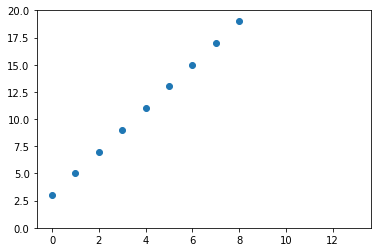

<Figure size 432x288 with 0 Axes>

In [20]:
x=np.arange(0,14,1)
y=2*x+3
plt.scatter(x,y)
#plt.scatter(area,precios)
plt.ylim(0,20)
plt.figure()

Vamos a buscar los parametros slope e intercept que mejor aproximen la función lineal a nuestros datos. 

__y = slope * x + intercept__

Donde:
* slope = pendiente 
* y-intercep = origen o intersección con el eje y (ordenada al origen)

In [21]:
from ipywidgets import interact
@interact
def show(slope=3,intercept=5):
    x=np.arange(0,14,1) #array de los primeros 14 numeros tomados de 1 en 1
    y=slope*x+intercept #funcíon lineal
    plt.plot(x,y)
    plt.scatter(area,precios)
    plt.ylim(0,20)
    plt.figure()

interactive(children=(IntSlider(value=3, description='slope', max=9, min=-3), IntSlider(value=5, description='…

Para optimizar la función lineal que describa nuestro modelo de datos, debemos minimizar las distancias de los puntos del modelo a la linea de regresión

In [22]:
from ipywidgets import interact

@interact(slope=(-3,5,.1),intercept=(-3,5,.1))
def show(slope=3,intercept=3):
    x=np.arange(0,14,1)
    y=slope*x+intercept
    plt.plot(x,y)
    plt.scatter(area,precios)
    for i,p in enumerate(area): 
        plt.plot([p,p],[precios[i],slope*p+intercept],color="r")
    plt.ylim(0,20)
    plt.figure()

interactive(children=(FloatSlider(value=3.0, description='slope', max=5.0, min=-3.0), FloatSlider(value=3.0, d…

Pongamoslo en forma de funcion para el ejemplo de (area, precios)

In [23]:
def error(intercept,slope):
    yp = intercept + slope * area
    return np.mean((precios-yp)**2)

Dibujamos la función error para el ejemplo (area,precios) probando con distintos valores de origen y pendiente.

In [24]:
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)

import numpy as np
u=np.arange(-1000 ,1000.0, 50)
v=np.arange(-1000 ,1000.0, 50)
u,v=np.meshgrid(u,v)
shape=u.shape
u=u.reshape(-1)
v=v.reshape(-1)

ERROR=np.array([error(a,b) for a,b in zip(u,v)])

u=u.reshape(shape)
v=v.reshape(shape)
ERROR=ERROR.reshape(shape)

py.iplot([go.Surface(x=u,y=v,z=ERROR)])

AttributeError: module 'plotly.validators.surface.colorbar' has no attribute 'TitlefontValidator'

Ajustamos la pendiente y el origen de la función de regresión lineal, de forma que el error cada vez sea menor.

Esta es la forma "bruta" del algoritmo del __gradiente descendente__ 

In [39]:
# Iteramos esta maniobra 55000 de veces
delta = 0.01
u = -1
v = 2.9

#Guardamos los valores intermedios de u y v para visualizerlos despues
ubuf=[u]
vbuf=[v]
errorbuf=[error(u,v)]
errorp = error(u,v)
for i in range(55000):
    
    if error(u+delta,v) < errorp:
        u+=delta
    else:
        u-=delta  
        
    if error(u,v+delta) < errorp:
        v+=delta
    else:
        v-=delta
        
    errorp = error(u,v)
    ubuf.append(u)
    vbuf.append(v)
    errorbuf.append(errorp)
    
print(u)
print(v)
print(error(u,v))

1.9200000000000021
0.820000000000018
5.122677507256868


In [40]:
py.iplot([go.Scatter(x=ubuf,y=errorbuf)])

In [41]:
py.iplot([go.Scatter(x=vbuf,y=errorbuf)])

In [42]:
u=np.arange(-4 ,4.0, 0.1)
v=np.arange(-4 ,4.0, 0.1)
u,v=np.meshgrid(u,v)
shape=u.shape
u=u.reshape(-1)
v=v.reshape(-1)

ERROR=np.array([error(a,b) for a,b in zip(u,v)])

u=u.reshape(shape)
v=v.reshape(shape)
ERROR=ERROR.reshape(shape)
py.iplot([go.Surface(x=u,y=v,z=ERROR),
          go.Scatter3d(go.Scatter3d(x=ubuf,y=vbuf,z=errorbuf))])

AttributeError: module 'plotly.validators.surface.colorbar' has no attribute 'TitlefontValidator'

# Intuicion de la covarianza:

In [ ]:
plt.scatter(area,precios)
plt.axhline(y=np.mean(precios))
plt.axvline(x=np.mean(area));

In [ ]:
precios-np.mean(precios)

In [ ]:
area-np.mean(area)

In [ ]:
l1=precios-np.mean(precios)
l2=area-np.mean(area)
l3=(precios-np.mean(precios))*(area-np.mean(area))

In [ ]:
import pandas as pd
pd.DataFrame({"p-ep":l1,"a-ea":l2,"(p-ep)(a-ea)":l3})
#p-ep = precios - la esperanza de los precios o media
#a-ap = area -la esperanza del area o media

In [ ]:
#LA COVARIANZA ES
covarianza = np.mean((precios-np.mean(precios))*(area-np.mean(area)))
covarianza

In [ ]:
#matriz de covarianza, muestra las varianzas de area y precios y la covarianza
np.cov(area,precios,bias=True)

In [ ]:
area.var()

In [ ]:
precios.var()

__Coeficiente de correlación__

In [ ]:
np.corrcoef(area,precios)

In [ ]:
import math
covarianza/math.sqrt(precios.var()*area.var())

# Gradiente Descendiente
La forma elegante de buscar un minimo es buscando aquellos parametros (origen, pendiente) para los que la derivada es cero. Para los calculos vamos a igualar
* u = origen
* v = pendiente

Resolviendo:
$$f(u,v)=(−𝑢−𝑣𝑥𝑖+𝑦𝑖)^2$$
$$\nabla f(u,v)= \left( \frac{\partial f}{\partial u}(u,v), \frac{\partial f}{\partial v}(u,v)\right)=(0,0).$$
$$\left\{ \begin{array}{ll}  \frac{\partial f}{\partial u}(u,v)=-2\bar{y}+2u+2v\bar{x}=0 \\
 \frac{\partial f}{\partial v}(u,v)=-\frac{2}{n}\sum_{i=1}^nx_iy_i+2u \bar{x}+\frac{2v}{n}\sum_{i=1}^nx_i^2=0 \end{array} \right.$$ $$  \Longleftrightarrow \; \left\{ \begin{array}{ll} u+v\bar{x}=\bar{y} \\ u\bar{x}+
 v\frac{1}{n}\sum_{i=1}^nx_i^2=\frac{1}{n}\sum_{i=1}^nx_iy_i \end{array} \right. .$$ 

$$ \boxed{ y=\bar{y}-\frac{\textrm{cov}_{x,y}}{v_x}\bar{x}+\frac{\textrm{cov}_{x,y}}{v_x}x} $$

In [ ]:
np.cov(area,precios)[0][1]

In [ ]:
pendiente=np.cov(area,precios,bias=True)[0][1]/np.var(area)
pendiente

In [ ]:
origen=np.mean(precios)-pendiente*np.mean(area)
origen

Existe una libreria en Python que te hace todos estos calculos

In [ ]:
from scipy import stats
stats.linregress(area,precios)

In [ ]:
result=stats.linregress(area,precios)

In [ ]:
plt.scatter(area,precios)
area_2=np.concatenate([area,[0]])
plt.plot(area_2,area_2*result.slope+result.intercept)
plt.show()

In [ ]:
ps = precios[precios<10]
ars = area[precios<10]
plt.scatter(ars,ps);

In [ ]:
np.corrcoef(ars,ps)

In [ ]:
result=stats.linregress(ars,ps)
x = np.array([2,12])
yp = result.slope * x + result.intercept
plt.scatter(ars,ps)
plt.plot(x,yp);

In [ ]:
errores = ps-(result.slope * ars + result.intercept)
plt.hist(errores);